In [1]:
#%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import marshaltools
from ast import literal_eval
import logging
from astropy.time import Time
from ipywidgets import interactive
import ipywidgets as widgets
import re, os
import sncosmo
import json

from utils import get_config
from utils import has_iband

from astropy import units as u
from astropy.coordinates import SkyCoord

import seaborn as sns

In [2]:
SNcut = 5  

In [3]:
# Download data
# Now fun starts for real. Also load cosmology list to make sure we are not missing types from there
pl = marshaltools.ProgramList('AMPEL Test',load_candidates=False)
cpl = marshaltools.ProgramList('Cosmology',load_candidates=False)
rpl = marshaltools.ProgramList('Redshift Completeness Factor',load_candidates=False)


INFO:marshaltools.ProgramList:Initialized ProgramList for program AMPEL Test (ID 4)
INFO:marshaltools.ProgramList:Loaded 223 saved sources for program AMPEL Test.
INFO:marshaltools.ProgramList:Initialized ProgramList for program Cosmology (ID 2)
INFO:marshaltools.ProgramList:Loaded 459 saved sources for program Cosmology.
INFO:marshaltools.ProgramList:Initialized ProgramList for program Redshift Completeness Factor (ID 3)
INFO:marshaltools.ProgramList:Loaded 815 saved sources for program Redshift Completeness Factor.


In [4]:
# Creating an empty dict for the sncosmo fits
sncosmofits = {}

In [5]:
# Collect all SNe Ia and do saltfit
# This is the timeconsuming part. Downloading all the data and do saltfits. Let it start and get a coffee
for program in (pl,cpl,rpl):
    print("NEW PROGRAM")
    for count, sn in enumerate(program.sources.keys()):
        print(sn)
        if program.sources[sn]['classification'] is None:
            continue
        if not re.search('Ia',program.sources[sn]['classification']):
            continue
        if sn in sncosmofits.keys():
            print("%s already done"%(sn))
            continue
            
        # Check redshift
        z = program.sources[sn]['redshift']
        if z is None:
            print("No redshift but known type - why?")
        else:
            print(" ... at z %s"%(z))
            
            
        # Download specific LC
        lc = program.get_lightcurve(sn)
        del program.lightcurves[sn]

    
    
        # create a model
        model = sncosmo.Model(source='salt2')
    
        # Massage data
        data = lc.table_sncosmo
        #data["mjd"] = data["mjd"]-Time.now().mjd
        #data = data[ (data["mjd"]>-maxage) ]
        
        
    
        # Replicating data quality checks
        signalNoise = np.abs(data["flux"])/data["fluxerr"]
        if len(signalNoise[signalNoise>SNcut])==0:
            print("Not enugh good data for SN %s. Manual inspection prob needed."%(sn))
            sncosmofits[sn] = None            
            continue            
        data = data[ (signalNoise>SNcut) ]

        
        # Estimate time bound
        t0bound = (np.min(data["mjd"]),np.max(data["mjd"]))
        if (t0bound[1]-t0bound[0])<15:
            print("Time region too short")
            sncosmofits[sn] = None            
            continue
    
    
        # Set up fit parameters
        fitparam = ['t0', 'x0', 'x1']
        bounds={'x1':(-5.,5.),'t0':t0bound}
        if z is None:
            # Have to fit it
            fitparam.append('z')
            bounds['z'] = (0.,0.2)
        else:
            model.set(z=z)  # set the model's redshift.
        # Check nbr filters filters
        print( np.unique(data["band"]) )
        if len(np.unique(data["band"]))<2:
            print("SN %s has too few filters for saltfit."%(sn))
            model.set(c=0)
        else:
            fitparam.append('c')
            bounds['c'] = (-1.,2.)
            
        #print(data)
        #print(fitparam)
        #print(bounds)

        try:
            result, fitted_model = sncosmo.fit_lc(
                data, model, fitparam, bounds=bounds)
            sncosmofits[sn] = result, fitted_model, data
            
        except ValueError:
            sncosmofits[sn] = None  
            print("SALT fit fails for SN %s. Manual inspection prob needed."%(sn))

        

NEW PROGRAM
ZTF18aakgsmi
ZTF18aasdted
 ... at z 0.01815


/home/jnordin/local/miniconda2/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning: divide by zero encountered in true_divide
/home/jnordin/local/miniconda2/envs/py36/lib/python3.6/site-packages/sncosmo/fitting.py:195: RuntimeWarning: divide by zero encountered in true_divide
  significant_data = data[(data.flux / data.fluxerr) > minsnr]


band
----
p48g
p48r
ZTF18aaupjtd
ZTF18aauvptt
ZTF18abmwzws
ZTF18aawlhkh
ZTF18abddhaa
ZTF18abddgzz
ZTF18abgucjb
ZTF18ablvpuj
ZTF18ablqqeb
ZTF18ablviog
ZTF18ablllyw
ZTF18ablwwwb
ZTF18ablowct
ZTF18ablprcf
ZTF18abmxfrc
 ... at z 0.06
band
----
p48g
p48r
ZTF18abmjzjq
ZTF18abnxhmc
 ... at z 0.076
band
----
p48g
p48r
ZTF18abnvnqb
 ... at z 0.1
band
----
p48g
p48r
ZTF18abkxlcz
 ... at z 0.1
band
----
p48g
p48r
ZTF18abokvkt
ZTF18abmnvkx
ZTF18aboaeqy
 ... at z 0.115
band
----
p48g
p48r
ZTF18aboivnq
ZTF18abmjayl
ZTF18abnblil
ZTF18abmszpd
ZTF18ablovvu
ZTF18abmacke
ZTF18abntwvr
ZTF18aayhpph
ZTF18abmrqmv
ZTF18abmdxst
ZTF17aaaafcd
ZTF18ablxhtc
ZTF18abcqvhs
ZTF18ablxjic
ZTF18abmadcc
ZTF18ablrwlk
ZTF18abmdfba
ZTF18abmorft
ZTF18abmpbjy
ZTF18abmmxpg
ZTF18ablpztl
ZTF18ablskwf
ZTF18abmwuml
ZTF18abmnssw
ZTF18ablvibs
ZTF18abnunsl
ZTF18abnujuy
ZTF18abnpbjv
ZTF18abncqfx
ZTF18abnudmu
ZTF18abnzgwe
ZTF18abobtul
ZTF18aboqwkr
ZTF18abmkdun
ZTF18abnucig
 ... at z 0.09
band
----
p48g
p48r
ZTF18abglwpn
ZTF18abmaewl
 ..

/home/jnordin/local/github/marshaltools/marshaltools/MarshalLightcurve.py:120: RuntimeWarning: overflow encountered in double_scalars
  eflux[n] = 10**(-0.4*(r['limmag']-zp[n]))/5.


band
----
p48g
p48r
ZTF18abmnbne
ZTF18abmkaca
ZTF18abncimo
 ... at z 0.05684
band
----
p48g
SN ZTF18abncimo has too few filters for saltfit.
ZTF18abnvzah
ZTF18abnvoel
 ... at z 0.06
band
----
p48g
p48r
ZTF18abnygkb
 ... at z 0.07
band
----
p48g
p48r
ZTF18aboqvfa
ZTF18aborbhi
ZTF18aborkxd
ZTF18aborkox
ZTF18abmkbqo
ZTF18abnnnzk
ZTF18abpaywm
 ... at z 0.045
band
----
p48g
p48r
ZTF18abotaki
ZTF18abpavnx
ZTF18aboztta
 ... at z 0.106
band
----
p48g
p48r
ZTF18abmwpyl
 ... at z 0.13
band
----
p48g
p48r
ZTF18abpttky
 ... at z 0.084
band
----
p48g
p48r
ZTF18abporae
ZTF18abanjoi
ZTF18abpudlt
ZTF18abnuhuy
ZTF18abrlupd
 ... at z 0.055
band
----
p48g
p48r
ZTF18abmskzu
ZTF18abnvotk
ZTF18abnujcx
ZTF18abqbdcd
ZTF18abqbuaj
ZTF18abqboud
ZTF18abqbavl
 ... at z 0.14
band
----
p48g
p48r
ZTF18abqlpgq
 ... at z 0.095268
band
----
p48g
p48r
ZTF18aampjcm
ZTF18aaovssm
ZTF18ablruzq
ZTF18abqdadp
 ... at z 0.03955
band
----
p48g
p48r
ZTF18ablwtla
ZTF18abglikj
ZTF18abrwswl
ZTF18abqjvyl
 ... at z 0.0877
band
----
p48

/home/jnordin/local/miniconda2/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning: divide by zero encountered in true_divide
/home/jnordin/local/miniconda2/envs/py36/lib/python3.6/site-packages/sncosmo/fitting.py:195: RuntimeWarning: divide by zero encountered in true_divide
  significant_data = data[(data.flux / data.fluxerr) > minsnr]


band
----
p48g
p48r
ZTF18aabsyqp
 ... at z 0.07667
band
----
p48r
SN ZTF18aabsyqp has too few filters for saltfit.
ZTF18aaaoaeq
No redshift but known type - why?
band
----
p48r
SN ZTF18aaaoaeq has too few filters for saltfit.
ZTF18aaanzph
No redshift but known type - why?
band
----
p48r
SN ZTF18aaanzph has too few filters for saltfit.
ZTF18aaajrso
 ... at z 0.085
band
----
p48r
SN ZTF18aaajrso has too few filters for saltfit.
ZTF18aaadqua
 ... at z 0.07
Time region too short
ZTF18aabtaor
 ... at z 0.07
band
----
p48r
SN ZTF18aabtaor has too few filters for saltfit.
ZTF18aabvpeg
 ... at z 0.037
band
----
p48r
SN ZTF18aabvpeg has too few filters for saltfit.
ZTF18aabssme
 ... at z 0.04
Time region too short
ZTF18aabtwqb
 ... at z 0.0738
Time region too short
ZTF18aabyhlc
 ... at z 0.029
band
----
p48g
p48i
p48r
ZTF18aabstmw
 ... at z 0.023
 band
-----
 p48r
uvotb
uvotu
uvotv
ZTF18aagrcir
 ... at z 0.077
band
----
p48g
p48r
ZTF18aaguhgb
 ... at z 0.12429
band
----
p48g
p48r
ZTF18aagrgao
 

band
----
p48g
p48r
ZTF18aawdpnm
 ... at z 0.0439
band
----
p48r
SN ZTF18aawdpnm has too few filters for saltfit.
ZTF18aakgzot
 ... at z 0.034
band
----
p48g
p48r
ZTF18aauvnhh
 ... at z 0.058
band
----
p48r
SN ZTF18aauvnhh has too few filters for saltfit.
ZTF18aaqfziz
 ... at z 0.05383
band
----
p48g
p48r
ZTF18aaupmks
 ... at z 0.04
band
----
p48g
p48r
ZTF18aawtveo
 ... at z 0.16
band
----
p48g
p48r
ZTF18aawpcel
 ... at z 0.15
band
----
p48g
p48r
ZTF18aaqffyp
 ... at z 0.073
band
----
p48g
p48r
ZTF18aaxcxih
 ... at z 0.07
band
----
p48g
p48r
ZTF18aaxavsk
 ... at z 0.08
band
----
p48g
p48r
ZTF18aavrwhu
 ... at z 0.062
band
----
p48g
p48r
ZTF18aaxdrjn
 ... at z 0.0339
band
----
p48g
p48r
ZTF18aaxkfos
 ... at z 0.075
band
----
p48g
p48r
ZTF18aaxmixe
 ... at z 0.1
band
----
p48r
SN ZTF18aaxmixe has too few filters for saltfit.
ZTF18aaqjtcz
ZTF18aaxmacd
 ... at z 0.14
Time region too short
ZTF18aaxrvzj
 ... at z 0.11
band
----
p48g
p48r
ZTF18aaydmkh
 ... at z 0.0845
band
----
p48g
p48r
ZTF1

/home/jnordin/local/miniconda2/envs/py36/lib/python3.6/site-packages/sncosmo/fitting.py:160: RuntimeWarning: Dropping following bands from data: uvm2, uvw2, uvw1(out of model wavelength range)
  "(out of model wavelength range)", RuntimeWarning)


ZTF18aaxwjmp
 ... at z 0.08
band
----
p48g
p48r
ZTF18aajpjdi
 ... at z 0.0746
band
----
p48g
p48r
ZTF18aazblzy
 ... at z 0.064
band
----
p48g
p48i
p48r
ZTF18aazsabq
 ... at z 0.05
band
----
p48g
p48r
ZTF18aazgfkq
 ... at z 0.028
band
----
p48r
SN ZTF18aazgfkq has too few filters for saltfit.
ZTF18aaxvpsw
 ... at z 0.0916
band
----
p48g
p48r
ZTF18aawczad
 ... at z 0.0682
band
----
p48g
p48r
ZTF18aaytovs
 ... at z 0.076
band
----
p48g
p48r
ZTF18abaeawz
 ... at z 0.1
band
----
p48g
p48r
ZTF18aazcoob
 ... at z 0.088
band
----
p48g
p48r
ZTF18abatffv
 ... at z 0.144
band
----
p48g
p48r
ZTF18aashtth
ZTF18abbpeqo
 ... at z 0.06678
band
----
p48g
p48r
ZTF18aazxthg
 ... at z 0.045
band
----
p48g
SN ZTF18aazxthg has too few filters for saltfit.
ZTF18abbodly
 ... at z 0.0188
band
----
p48g
p48r
ZTF18aaxtcdm
 ... at z 0.075
band
----
p48g
p48r
ZTF18aazabmh
 ... at z 0.073
band
----
p48g
p48r
ZTF18abaxlpi
 ... at z 0.0646
band
----
p48g
p48r
ZTF18abadjhx
 ... at z 0.076
band
----
p48g
p48r
ZTF18aayi

/home/jnordin/local/miniconda2/envs/py36/lib/python3.6/site-packages/sncosmo/fitting.py:160: RuntimeWarning: Dropping following bands from data: uvw2(out of model wavelength range)
  "(out of model wavelength range)", RuntimeWarning)


band
----
p48g
p48r
ZTF18abcflnz
 ... at z 0.024
band
----
p48g
p48i
p48r
ZTF18abakjgq
 ... at z 0.054
band
----
p48g
p48r
ZTF18abcdzyc
 ... at z 0.0557
band
----
p48g
p48r
ZTF18abcsgvj
 ... at z 0.06
band
----
p48g
p48r
ZTF18aazhwnh
 ... at z 0.0907
Time region too short
ZTF18abcrtnq
 ... at z 0.10151
band
----
p48g
p48r
ZTF18abcrxoj
 ... at z 0.0309
band
----
p48g
p48r
ZTF18aaumeys
 ... at z 0.03754
band
----
p48g
p48r
ZTF18abcpolh
 ... at z 0.03512
band
----
p48r
SN ZTF18abcpolh has too few filters for saltfit.
ZTF18abcryxz
 ... at z 0.0646
Time region too short
ZTF18abcxyjp
 ... at z 0.04216
band
----
p48g
p48i
p48r
ZTF18abdbuty
 ... at z 0.075
band
----
p48g
p48r
ZTF18abdfazk
 ... at z 0.087
band
----
p48g
p48r
ZTF18abdfaqi
 ... at z 0.04828
band
----
p48g
p48r
ZTF18abdefet
 ... at z 0.075
band
----
p48g
p48r
ZTF18abauprj
 ... at z 0.028
 band
-----
 p48g
 p48r
uvotb
uvotu
uvotv
 uvw1
 uvw2


/home/jnordin/local/miniconda2/envs/py36/lib/python3.6/site-packages/sncosmo/fitting.py:160: RuntimeWarning: Dropping following bands from data: uvw2, uvw1(out of model wavelength range)
  "(out of model wavelength range)", RuntimeWarning)


ZTF18abdcfgz
 ... at z 0.05
band
----
p48r
SN ZTF18abdcfgz has too few filters for saltfit.
ZTF18abdfwur
 ... at z 0.07
band
----
p48g
p48r
ZTF18abdfydj
 ... at z 0.07
band
----
p48g
p48r
ZTF18abdgwxn
 ... at z 0.0638
band
----
p48g
p48r
ZTF18abddrhd
 ... at z 0.09
band
----
p48g
p48r
ZTF18abdiwpt
 ... at z 0.073
band
----
p48g
p48r
ZTF18abdiqdh
 ... at z 0.03834
band
----
p48g
p48r
ZTF18abealop
 ... at z 0.06658
band
----
p48g
p48r
ZTF18abdhsfc
 ... at z 0.067
band
----
p48g
p48r
ZTF18abdrmin
 ... at z 0.05154
band
----
p48g
p48r
ZTF18abfgygp
 ... at z 0.07
band
----
p48g
p48r
ZTF18abetehf
 ... at z 0.064875
band
----
p48g
p48r
ZTF18abdmgab
 ... at z 0.081
band
----
p48g
p48r
ZTF18abetewu
 ... at z 0.077
band
----
p48g
p48r
ZTF18abcvush
 ... at z 0.05
band
----
p48g
p48r
ZTF18abebzog
 ... at z 0.044
band
----
p48g
p48r
ZTF18abeecwe
 ... at z 0.04
band
----
p48g
p48r
ZTF18abeaipj
 ... at z 0.08
band
----
p48g
p48r
ZTF18aansqun
 ... at z 0.05964
band
----
p48g
p48r
ZTF18abdkimx
 ... at 

band
----
p48g
SN ZTF18abrytwr has too few filters for saltfit.
ZTF18aboebsg
 ... at z 0.1
band
----
p48g
p48r
ZTF18abotcjv
ZTF18abotcjv already done
ZTF18abnysyy
ZTF18abnysyy already done
ZTF18ablmduj
ZTF18absspcp
 ... at z 0.0658
band
----
p48g
p48r
ZTF18abryewg
ZTF18abryewg already done
ZTF18abskzjm
 ... at z 0.1
band
----
p48g
p48r
ZTF18abssukb
ZTF18abssukb already done
ZTF18abscygs
ZTF18abscygs already done
ZTF18abtfrbf
 ... at z 0.0569
band
----
p48g
p48r
ZTF18absdjms
ZTF18absdjms already done
ZTF18abshtdj
 ... at z 0.062556
band
----
p48g
p48r
ZTF18absqhza
 ... at z 0.06
band
----
p48g
SN ZTF18absqhza has too few filters for saltfit.
ZTF18absgnio
 ... at z 0.06
band
----
p48g
p48r
ZTF18abshmro
 ... at z 0.0543
Time region too short
ZTF18abssuxz
 ... at z 0.0649
Time region too short
ZTF18abtnlik
 ... at z 0.09
band
----
p48g
p48r
ZTF18abtqevs
 ... at z 0.044
band
----
p48g
p48r
ZTF18absyyig
 ... at z 0.041
band
----
p48g
SN ZTF18absyyig has too few filters for saltfit.
ZTF18abtm

band
----
p48r
SN ZTF18abrzcgl has too few filters for saltfit.
ZTF18abrxqag
ZTF18abrwwzs
ZTF18aakehpc
ZTF18absmoql
ZTF18aaybtnt
ZTF18absnibc
ZTF17aaaukqn
ZTF18absliyc
ZTF18absliyc already done
ZTF18abscyjj
ZTF18abrzbyt
ZTF18absldfl
ZTF18absclsr
ZTF18abrytwr
ZTF18abrytwr already done
ZTF18abscyji
ZTF18aboebsg
ZTF18aboebsg already done
ZTF18abotcjv
ZTF18abotcjv already done
ZTF18absrrbv
ZTF18abortku
ZTF18absspcp
ZTF18absspcp already done
ZTF18absrffm
ZTF18abshezu
ZTF18abskzjm
ZTF18abskzjm already done
ZTF18absgnbm
ZTF18abtfrbf
ZTF18abtfrbf already done
ZTF18abnuexr
ZTF18abshtdj
ZTF18abshtdj already done
ZTF18abrynno
ZTF18abrxrms
ZTF18absjiej
ZTF18abskoyh
ZTF18absqhza
ZTF18absqhza already done
ZTF18abtizrj
ZTF18absgnio
ZTF18absgnio already done
ZTF18abshmro
ZTF18abshmro already done
ZTF18abssuxz
ZTF18abssuxz already done
ZTF18abthaii
ZTF18abtnlik
ZTF18abtnlik already done
ZTF18absnqyo
ZTF18absqkfg
ZTF18abtmtfy
ZTF18abtqevs
ZTF18abtqevs already done
ZTF18absbgqd
ZTF18absekpz
ZTF18absyyig


In [37]:
# Created a combined sources dict
sources = {}
for program in (pl,cpl,rpl):
    for count, sn in enumerate(program.sources.keys()):
        print(sn)
        if program.sources[sn]['classification'] is None:
            continue
        if not re.search('Ia',program.sources[sn]['classification']):
            continue
        if sn in sources.keys():
            continue
        sources[sn] = program.sources[sn]
        print('... new Ia')

ZTF18aakgsmi
ZTF18aasdted
... new Ia
ZTF18aaupjtd
ZTF18aauvptt
ZTF18abmwzws
ZTF18aawlhkh
ZTF18abddhaa
ZTF18abddgzz
ZTF18abgucjb
ZTF18ablvpuj
ZTF18ablqqeb
ZTF18ablviog
ZTF18ablllyw
ZTF18ablwwwb
ZTF18ablowct
ZTF18ablprcf
ZTF18abmxfrc
... new Ia
ZTF18abmjzjq
ZTF18abnxhmc
... new Ia
ZTF18abnvnqb
... new Ia
ZTF18abkxlcz
... new Ia
ZTF18abokvkt
ZTF18abmnvkx
ZTF18aboaeqy
... new Ia
ZTF18aboivnq
ZTF18abmjayl
ZTF18abnblil
ZTF18abmszpd
ZTF18ablovvu
ZTF18abmacke
ZTF18abntwvr
ZTF18aayhpph
ZTF18abmrqmv
ZTF18abmdxst
ZTF17aaaafcd
ZTF18ablxhtc
ZTF18abcqvhs
ZTF18ablxjic
ZTF18abmadcc
ZTF18ablrwlk
ZTF18abmdfba
ZTF18abmorft
ZTF18abmpbjy
ZTF18abmmxpg
ZTF18ablpztl
ZTF18ablskwf
ZTF18abmwuml
ZTF18abmnssw
ZTF18ablvibs
ZTF18abnunsl
ZTF18abnujuy
ZTF18abnpbjv
ZTF18abncqfx
ZTF18abnudmu
ZTF18abnzgwe
ZTF18abobtul
ZTF18aboqwkr
ZTF18abmkdun
ZTF18abnucig
... new Ia
ZTF18abglwpn
ZTF18abmaewl
... new Ia
ZTF18abnbhpu
ZTF18ablwafp
ZTF18abmjcbs
... new Ia
ZTF18abmnbne
ZTF18abmkaca
ZTF18abncimo
... new Ia
ZTF18abnygkb
... ne

In [66]:
# Limit the sncosmofits
snfits_cut = {sn: fit for sn, fit in sncosmofits.items() if not fit is None and fit[0]['success'] 
              and fit[0]['ndof']>0 and fit[0]['chisq']/fit[0]['ndof']<10}
snfits_fail = {sn: fit for sn, fit in sncosmofits.items() if fit is None or not fit[0]['success'] 
               or fit[0]['ndof']<1 or fit[0]['chisq']/fit[0]['ndof']>10}
print(len(snfits_cut))
print(len(snfits_fail))

342
110


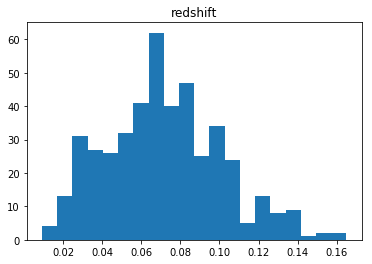

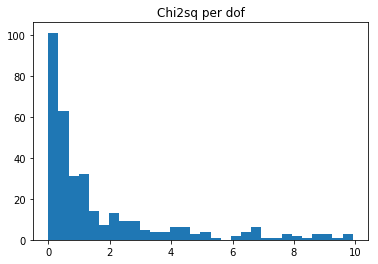

In [67]:
# What do we want to plot?
# readshift, peak date and peak magnitude distribution (possibly cumulative)
zs = [float(s['redshift']) for sn,s in sources.items() if not s['redshift'] is None]
plt.title('redshift')
_ = plt.hist(zs,bins=20)
plt.show()
# chi2deg
foo = [fit[0]['chisq']/fit[0]['ndof'] for sn, fit in snfits_cut.items()]
plt.title('Chi2sq per dof')
_ = plt.hist(foo,bins=30)
plt.show()
# Plot of all lightcurves (within time range?) Names of SNe?

In [78]:
# Generate sncosmo fit parameters
fitparam = {}
for p in ['z','t0','x0','x1','c']:
    fitparam[p] = []
    fitparam[p+'.err'] = []
    for sn, fit in snfits_cut.items():
        if p in fit[0]["errors"].keys():
            e = fit[0]["errors"][p]
            f = fit[0]["parameters"][fit[0]["param_names"].index(p)]
            fitparam[p].append(f)
            fitparam[p+'.err'].append(e)

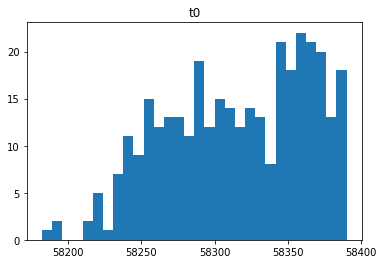

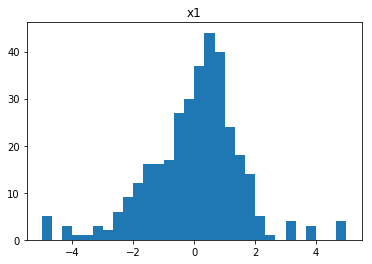

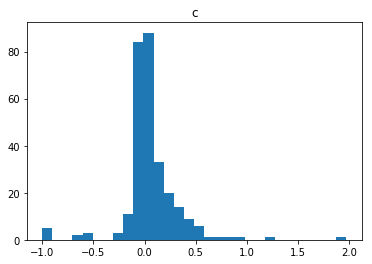

In [81]:
# Plot these
for p in ['t0','x1','c']:
    plt.title(p)
    _ = plt.hist(fitparam[p],bins=30)
    plt.show()

/home/jnordin/local/miniconda2/envs/py36/lib/python3.6/site-packages/sncosmo/models.py:187: RuntimeWarning: invalid value encountered in log10
  result[i] = -2.5 * np.log10(f / zpf)
/home/jnordin/local/miniconda2/envs/py36/lib/python3.6/site-packages/sncosmo/models.py:187: RuntimeWarning: divide by zero encountered in log10
  result[i] = -2.5 * np.log10(f / zpf)


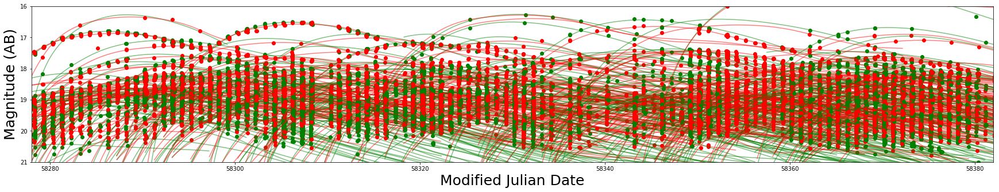

In [109]:
# Plot parameters
t0range = [58280,58380]
axis = [t0range[0]-2,t0range[1]+2,21,16]
plt.figure(figsize=(30,5))
# And now lets make a big plot
textoffset = 0
for sn, fit in snfits_cut.items():
    result, fitted_model, data = fit
    t0 = result["parameters"][result["param_names"].index('t0')]
    if t0<t0range[0] or t0>t0range[1]:
        continue
    for c, band in zip(['green','red'],['p48g','p48r']):
        iB = (data["band"]==band)
        f = data["flux"][iB]
        obsm = - 2.5 * np.log10(f) + 25.00
        plt.plot(data["mjd"][iB],obsm,'o',color=c)
        d = np.arange(np.min(data["mjd"])-3,np.max(data["mjd"])+3,0.1)
        m = fitted_model.bandmag(band,'ab',d)
        m, d = m[m<21],d[m<21]
        plt.plot(d,m,color=c,alpha=0.5)
    #plt.text(t0,13.5+textoffset*0.3,sn, horizontalalignment='center',alpha=0.8)
    #textoffset += 1
    #if textoffset==12:
    #    textoffset = 0

plt.axis(axis)
plt.xlabel('Modified Julian Date', fontsize=25)
plt.ylabel('Magnitude (AB)', fontsize=25)
plt.show()

In [125]:
peakmag,peakdate,zs = [],[],[]
#for sn, fit in snfits_cut.items():
for sn, fit in sncosmofits.items():
    if fit is None : continue
        
    result, fitted_model, data = fit
    t0 = result["parameters"][result["param_names"].index('t0')]
    if t0<t0range[0] or t0>t0range[1]:
        continue
        
    # Look at position
    c = SkyCoord(ra=sources[sn]['ra']*u.degree, dec=sources[sn]['dec']*u.degree, frame='icrs')
    if (np.abs(c.galactic.b.degree))<13:
        print('too close to galactic, not in DESI field')
        continue
        
    # Get peak mag
    f = data["flux"]
    obsm = - 2.5 * np.log10(f) + 25.00
    peakmag.append( np.min(obsm) )
    zs.append( result["parameters"][result["param_names"].index('z')] )
    peakdate.append(t0)
print("Found %s SNe Ia in %s days"%(len(zs),t0range[1]-t0range[0]))

too close to galactic, not in DESI field
too close to galactic, not in DESI field
too close to galactic, not in DESI field
too close to galactic, not in DESI field
too close to galactic, not in DESI field
too close to galactic, not in DESI field
too close to galactic, not in DESI field
too close to galactic, not in DESI field
too close to galactic, not in DESI field
too close to galactic, not in DESI field
too close to galactic, not in DESI field
too close to galactic, not in DESI field
too close to galactic, not in DESI field
Found 230 SNe Ia in 100 days


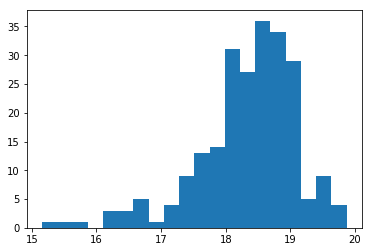

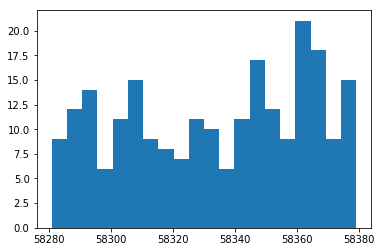

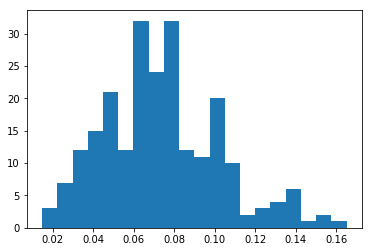

In [126]:
plt.hist(peakmag,bins=20)
plt.show()
plt.hist(peakdate,bins=20)
plt.show()
plt.hist(zs,bins=20)
plt.show()


/home/jnordin/local/miniconda2/envs/py36/lib/python3.6/site-packages/sncosmo/models.py:187: RuntimeWarning: divide by zero encountered in log10
  result[i] = -2.5 * np.log10(f / zpf)


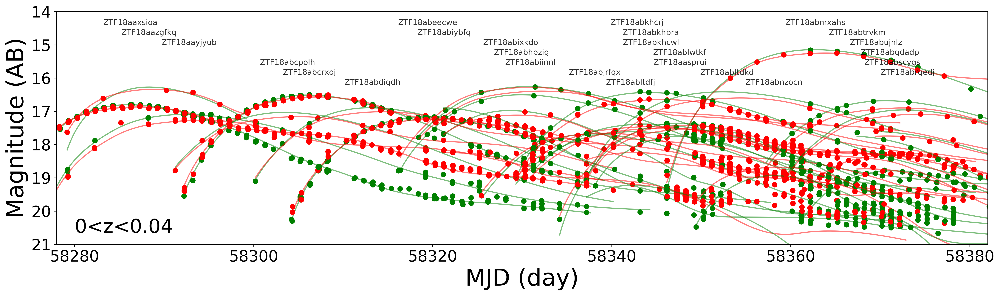

In [181]:
# Plot parameters
t0range = [58280,58380]
scale = 0.9
axis = [t0range[0]-2,t0range[1]+2,21,14.0]
fig = plt.figure(figsize=(20*scale,6*scale),dpi=300)
zrange = [0,0.04]
#zrange = [0.04,0.06]
#zrange = [0.06,0.08]
#zrange = [0.08,0.12]

# And now lets make a big plot
textoffset = 0

allpeaks = []
for sn, fit in snfits_cut.items():
    result, fitted_model, data = fit

    # Implement phase cut
    t0 = result["parameters"][result["param_names"].index('t0')]
    if t0<t0range[0] or t0>t0range[1]:
        continue
        
    # Impplement z cut
    z = float(sources[sn]['redshift'])
    if z<zrange[0] or z>zrange[1] : continue

    
    # Implement phase cut
    allpeaks.append( result["parameters"][result["param_names"].index('t0')] )
allpeaks.sort()


for sn, fit in snfits_cut.items():
    if sn in ['ZTF18abclfee'] : continue
    
    result, fitted_model, data = fit

    # Implement phase cut
    t0 = result["parameters"][result["param_names"].index('t0')]
    if t0<t0range[0] or t0>t0range[1]:
        continue
        
    # Impplement z cut
    z = float(sources[sn]['redshift'])
    if z<zrange[0] or z>zrange[1] : continue
    
    for c, band in zip(['green','red'],['p48g','p48r']):
        iB = (data["band"]==band)
        f = data["flux"][iB]
        obsm = - 2.5 * np.log10(f) + 25.00
        plt.plot(data["mjd"][iB],obsm,'o',color=c)
        d = np.arange(np.min(data["mjd"]),np.max(data["mjd"])+3,0.1)
        m = fitted_model.bandmag(band,'ab',d)
        m, d = m[m<21],d[m<21]
        plt.plot(d,m,color=c,alpha=0.5)
#    textoffset += 1
    iz = allpeaks.index(t0)
    textoffset = iz % 7
    plt.text(t0,14.4+textoffset*0.3,sn, horizontalalignment='center',alpha=0.8)
#    if textoffset==5:
#        textoff)set = 0

plt.text(58280.,20.5,'0<z<0.04', horizontalalignment='left', verticalalignment='center',fontsize=25)
plt.axis(axis)
#plt.title('SNe Ia ')
plt.xlabel('MJD (day)', fontsize=30)
plt.ylabel('Magnitude (AB)', fontsize=30)
plt.tick_params(labelsize=20)
plt.tight_layout()
fig.savefig('lowzi.png', transparent=True)
plt.show()

/home/jnordin/local/miniconda2/envs/py36/lib/python3.6/site-packages/sncosmo/models.py:187: RuntimeWarning: divide by zero encountered in log10
  result[i] = -2.5 * np.log10(f / zpf)


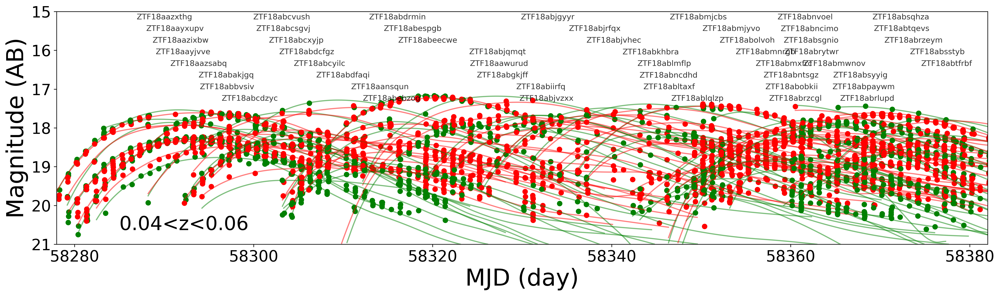

In [190]:
# midz
t0range = [58280,58380]
scale = 0.9
axis = [t0range[0]-2,t0range[1]+2,21,15.0]
fig = plt.figure(figsize=(20*scale,6*scale),dpi=300)
zrange = [0.04,0.06]
#zrange = [0.06,0.08]
#zrange = [0.08,0.12]

# And now lets make a big plot
textoffset = 0

allpeaks = []
for sn, fit in snfits_cut.items():
    result, fitted_model, data = fit
    # Implement phase cut
    t0 = result["parameters"][result["param_names"].index('t0')]
    if t0<t0range[0] or t0>t0range[1]:
        continue
    # Impplement z cut
    z = float(sources[sn]['redshift'])
    if z<zrange[0] or z>zrange[1] : continue
    # Implement phase cut
    allpeaks.append( result["parameters"][result["param_names"].index('t0')] )
allpeaks.sort()


for sn, fit in snfits_cut.items():
    if sn in ['ZTF18abclfee'] : continue
    
    result, fitted_model, data = fit

    # Implement phase cut
    t0 = result["parameters"][result["param_names"].index('t0')]
    if t0<t0range[0] or t0>t0range[1]:
        continue
        
    # Impplement z cut
    z = float(sources[sn]['redshift'])
    if z<zrange[0] or z>zrange[1] : continue
    
    for c, band in zip(['green','red'],['p48g','p48r']):
        iB = (data["band"]==band)
        f = data["flux"][iB]
        obsm = - 2.5 * np.log10(f) + 25.00
        plt.plot(data["mjd"][iB],obsm,'o',color=c)
        d = np.arange(np.min(data["mjd"]),np.max(data["mjd"])+3,0.1)
        m = fitted_model.bandmag(band,'ab',d)
        m, d = m[m<21],d[m<21]
        plt.plot(d,m,color=c,alpha=0.5)
#    textoffset += 1
    iz = allpeaks.index(t0)
    textoffset = iz % 8
    plt.text(t0,15.2+textoffset*0.3,sn, horizontalalignment='center',alpha=0.8)
#    if textoffset==5:
#        textoff)set = 0

plt.text(58285.,20.5,'0.04<z<0.06', horizontalalignment='left', verticalalignment='center',fontsize=25)
plt.axis(axis)
plt.xlabel('MJD (day)', fontsize=30)
plt.ylabel('Magnitude (AB)', fontsize=30)
plt.tick_params(labelsize=20)
plt.tight_layout()
fig.savefig('midzi.png', transparent=True)
plt.show()

/home/jnordin/local/miniconda2/envs/py36/lib/python3.6/site-packages/sncosmo/models.py:187: RuntimeWarning: divide by zero encountered in log10
  result[i] = -2.5 * np.log10(f / zpf)


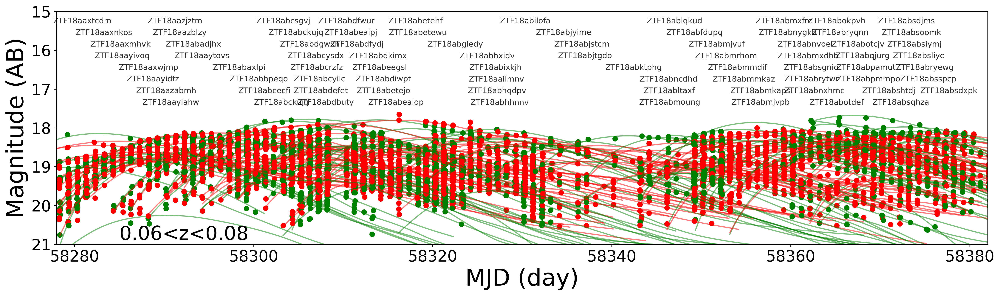

In [191]:
# higherz
t0range = [58280,58380]
scale = 0.9
axis = [t0range[0]-2,t0range[1]+2,21,15.0]
fig = plt.figure(figsize=(20*scale,6*scale),dpi=300)
zrange = [0.06,0.08]
#zrange = [0.08,0.12]

# And now lets make a big plot
textoffset = 0

allpeaks = []
for sn, fit in snfits_cut.items():
    result, fitted_model, data = fit
    # Implement phase cut
    t0 = result["parameters"][result["param_names"].index('t0')]
    if t0<t0range[0] or t0>t0range[1]:
        continue
    # Impplement z cut
    z = float(sources[sn]['redshift'])
    if z<zrange[0] or z>zrange[1] : continue
    # Implement phase cut
    allpeaks.append( result["parameters"][result["param_names"].index('t0')] )
allpeaks.sort()


for sn, fit in snfits_cut.items():
    if sn in ['ZTF18abclfee'] : continue
    
    result, fitted_model, data = fit

    # Implement phase cut
    t0 = result["parameters"][result["param_names"].index('t0')]
    if t0<t0range[0] or t0>t0range[1]:
        continue
        
    # Impplement z cut
    z = float(sources[sn]['redshift'])
    if z<zrange[0] or z>zrange[1] : continue
    
    for c, band in zip(['green','red'],['p48g','p48r']):
        iB = (data["band"]==band)
        f = data["flux"][iB]
        obsm = - 2.5 * np.log10(f) + 25.00
        plt.plot(data["mjd"][iB],obsm,'o',color=c)
        d = np.arange(np.min(data["mjd"]),np.max(data["mjd"])+3,0.1)
        m = fitted_model.bandmag(band,'ab',d)
        m, d = m[m<21],d[m<21]
        plt.plot(d,m,color=c,alpha=0.5)
#    textoffset += 1
    iz = allpeaks.index(t0)
    textoffset = iz % 8
    plt.text(t0,15.3+textoffset*0.3,sn, horizontalalignment='center',alpha=0.8)
#    if textoffset==5:
#        textoff)set = 0

plt.text(58285.,20.75,'0.06<z<0.08', horizontalalignment='left', verticalalignment='center',fontsize=25)
plt.axis(axis)
plt.xlabel('MJD (day)', fontsize=30)
plt.ylabel('Magnitude (AB)', fontsize=30)
plt.tick_params(labelsize=20)
plt.tight_layout()
fig.savefig('higherz.png', transparent=True)
plt.show()

/home/jnordin/local/miniconda2/envs/py36/lib/python3.6/site-packages/sncosmo/models.py:187: RuntimeWarning: divide by zero encountered in log10
  result[i] = -2.5 * np.log10(f / zpf)
/home/jnordin/local/miniconda2/envs/py36/lib/python3.6/site-packages/sncosmo/models.py:187: RuntimeWarning: invalid value encountered in log10
  result[i] = -2.5 * np.log10(f / zpf)
/home/jnordin/local/miniconda2/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:49: RuntimeWarning: invalid value encountered in less


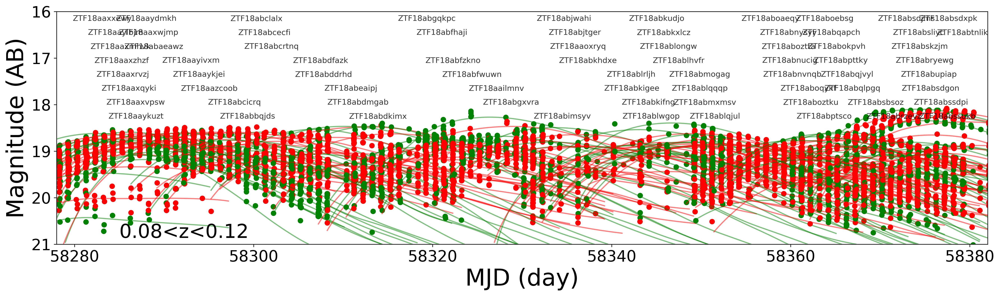

In [196]:
# highz
t0range = [58280,58380]
scale = 0.9
axis = [t0range[0]-2,t0range[1]+2,21,16.0]
fig = plt.figure(figsize=(20*scale,6*scale),dpi=300)
zrange = [0.08,0.12]

# And now lets make a big plot
textoffset = 0

allpeaks = []
for sn, fit in snfits_cut.items():
    result, fitted_model, data = fit
    # Implement phase cut
    t0 = result["parameters"][result["param_names"].index('t0')]
    if t0<t0range[0] or t0>t0range[1]:
        continue
    # Impplement z cut
    z = float(sources[sn]['redshift'])
    if z<zrange[0] or z>zrange[1] : continue
    # Implement phase cut
    allpeaks.append( result["parameters"][result["param_names"].index('t0')] )
allpeaks.sort()


for sn, fit in snfits_cut.items():
    if sn in ['ZTF18abclfee'] : continue
    
    result, fitted_model, data = fit

    # Implement phase cut
    t0 = result["parameters"][result["param_names"].index('t0')]
    if t0<t0range[0] or t0>t0range[1]:
        continue
        
    # Impplement z cut
    z = float(sources[sn]['redshift'])
    if z<zrange[0] or z>zrange[1] : continue
    
    if np.min(data["mjd"])>(t0-3) : continue
    
    for c, band in zip(['green','red'],['p48g','p48r']):
        iB = (data["band"]==band)
        f = data["flux"][iB]
        obsm = - 2.5 * np.log10(f) + 25.00
        plt.plot(data["mjd"][iB],obsm,'o',color=c)
        d = np.arange(np.min(data["mjd"]),np.max(data["mjd"])+3,0.1)
        m = fitted_model.bandmag(band,'ab',d)
        m, d = m[m<21],d[m<21]
        plt.plot(d,m,color=c,alpha=0.5)
#    textoffset += 1
    iz = allpeaks.index(t0)
    textoffset = iz % 8
    plt.text(t0,16.2+textoffset*0.3,sn, horizontalalignment='center',alpha=0.8)
#    if textoffset==5:
#        textoff)set = 0

plt.text(58285.,20.75,'0.08<z<0.12', horizontalalignment='left', verticalalignment='center',fontsize=25)
plt.axis(axis)
plt.xlabel('MJD (day)', fontsize=30)
plt.ylabel('Magnitude (AB)', fontsize=30)
plt.tick_params(labelsize=20)
plt.tight_layout()
fig.savefig('highz.png', transparent=True)
plt.show()

In [198]:
# Some sort of redshift distribution
sns.set(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})
pal = sns.cubehelix_palette(10, rot=-.25, light=.7)

/home/jnordin/local/miniconda2/envs/py36/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


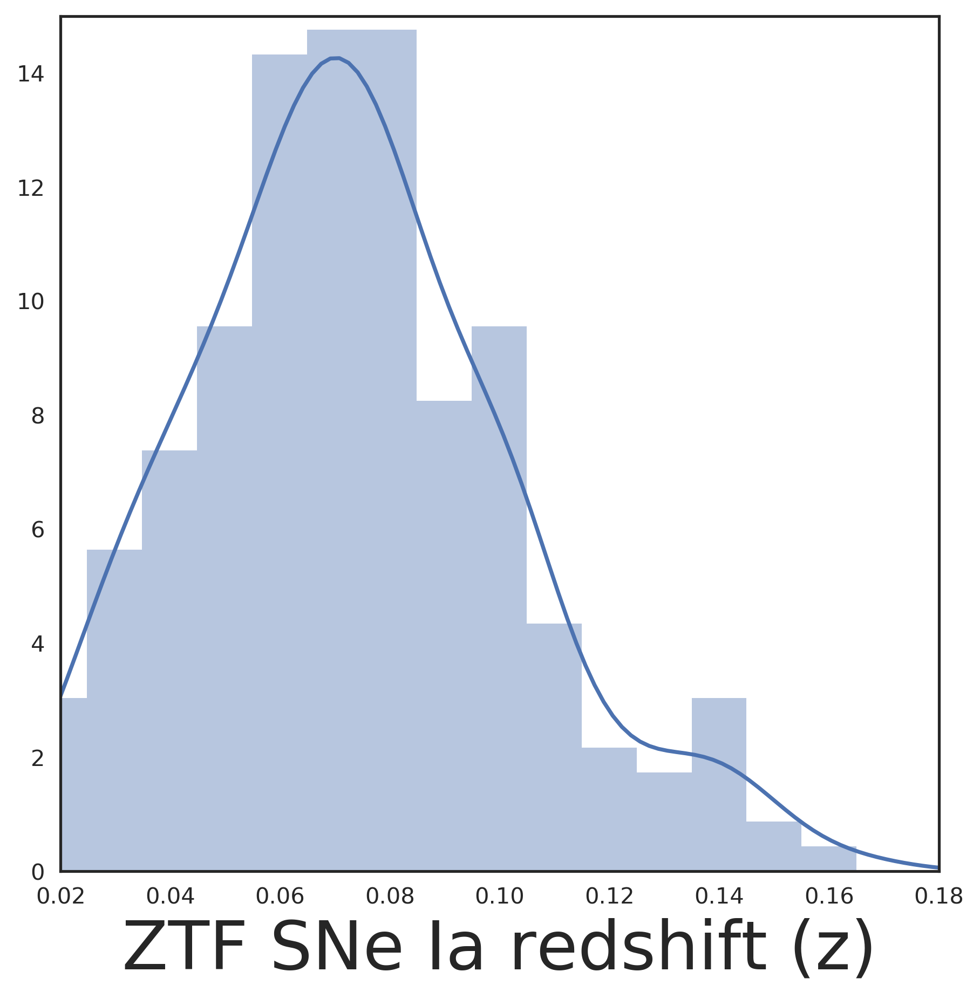

In [229]:
fig = plt.figure(1,figsize=(7,7),dpi=300)
ax = sns.distplot(zs,bins=15,kde=True)
plt.xlabel('ZTF SNe Ia redshift (z)', fontsize=30)
plt.axis([0.02,0.18,0,15])
fig.savefig('zdist.png', transparent=True)


/home/jnordin/local/miniconda2/envs/py36/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


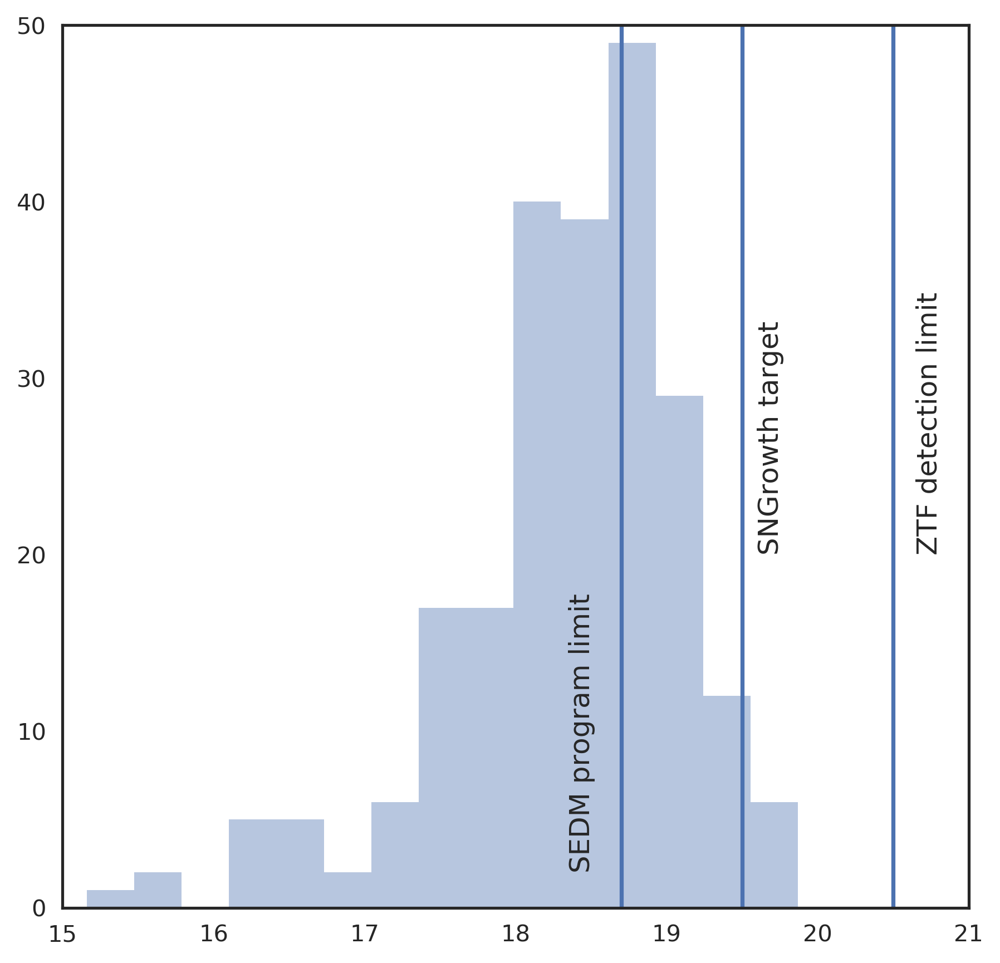

In [230]:
fig = plt.figure(1,figsize=(7,7),dpi=300)
ax = sns.distplot(peakmag,bins=15,hist=True,kde=False)
plt.axis([15.,21.,0,50])
plt.axvline(18.7)
plt.axvline(19.5)
plt.axvline(20.5)

plt.text(18.35,2,'SEDM program limit',rotation=90,verticalalignment="bottom")
plt.text(19.6,20,'SNGrowth target',rotation=90,verticalalignment="bottom")
plt.text(20.65,20,'ZTF detection limit',rotation=90,verticalalignment="bottom")

fig.savefig('peakdist.png', transparent=True)